<a href="https://colab.research.google.com/github/Obiechina14/Plant_Classification/blob/main/plant_disease_classifier_with_mobilenetv2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
os.chdir('/content/drive/MyDrive/Colab Notebooks/Plant Disease')

In [3]:
!pip install -q kaggle

In [4]:
#Authentication fof my Kaggle account
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

# Then move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 66 bytes


In [5]:
!kaggle datasets download -d vipoooool/new-plant-diseases-dataset

Dataset URL: https://www.kaggle.com/datasets/vipoooool/new-plant-diseases-dataset
License(s): copyright-authors
new-plant-diseases-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [5]:
import os

# Assuming the downloaded file is named "new-plant-diseases-dataset.zip"
zip_file_path = "new-plant-diseases-dataset.zip"
extract_directory = os.getcwd()  # Extracts to the current working directory

# Use the system's unzip command for extraction
!unzip -q "$zip_file_path" -d "$extract_directory"

print(f"Data extracted to: {extract_directory}")

Data extracted to: /content/drive/MyDrive/Colab Notebooks/Plant Disease


In [ ]:
import zipfile
import os

# Assuming the downloaded file is named "new-plant-diseases-dataset.zip"
zip_file_path = "new-plant-diseases-dataset.zip"
extract_directory = os.getcwd()  # Extracts to the current working directory

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_directory)

print(f"Data extracted to: {extract_directory}")

In [7]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import Dense,Flatten,Conv2D,MaxPooling2D
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers  import Concatenate
from tensorflow.keras.layers import AveragePooling2D, Dropout, Input, BatchNormalization
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.optimizers import SGD
from keras.preprocessing import image
from sklearn.metrics import precision_recall_curve
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import f1_score
import urllib.request
from sklearn.preprocessing import label_binarize
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score
from keras.layers import Input, Add, Dense,GlobalAvgPool2D, Concatenate, AvgPool2D, Dropout, ReLU, Activation, MaxPool2D, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, GlobalAveragePooling2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D
import matplotlib.pyplot as plt
import os
import pandas as pd
import seaborn as sns
import numpy as np
import cv2
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import RMSprop, Adam

# Read Data

In [8]:
train_dir = "/content/drive/MyDrive/Colab Notebooks/Plant Disease/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train"
size=224
from tensorflow.keras.applications.mobilenet_v2 import  preprocess_input

traindata_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range=90,
    width_shift_range=0.0,
    height_shift_range=0.0,
    shear_range=0.0,
    zoom_range=0.0,
    horizontal_flip=False,
    vertical_flip=False,
    rescale=1/255.0,
    preprocessing_function=None,
    validation_split=0.1,
).flow_from_directory(train_dir,
                      batch_size=164,
                      target_size=(size,size),
                      subset="training",
                      color_mode='rgb', #"rgb", "rgba", or "grayscale"
                      class_mode='categorical',  # Use 'binary', 'sparse','categorical' or None as needed
                      shuffle=True)

Found 63282 images belonging to 38 classes.


In [9]:
validdata_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    preprocessing_function=None,
    validation_split=0.1,
).flow_from_directory(train_dir,
                      batch_size=164,
                      target_size=(224,224),
                      subset='validation',
                      color_mode='rgb', #"rgb", "rgba", or "grayscale"
                      class_mode='categorical',  # Use 'binary', 'sparse','categorical' or None as needed
                      shuffle=False)

Found 7013 images belonging to 38 classes.


In [10]:
test_dir =   "/content/drive/MyDrive/Colab Notebooks/Plant Disease/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid/"
test_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    preprocessing_function=None,
).flow_from_directory(test_dir,
                      batch_size=164,
                      target_size=(224,224),
                      color_mode='rgb', #"rgb", "rgba", or "grayscale"
                      class_mode='categorical',  # Use 'binary', 'sparse','categorical' or None as needed
                      shuffle=False)

Found 17572 images belonging to 38 classes.


# Visualize Images

In [11]:
classes = os.listdir(train_dir)
print(f"Classes found: {classes}")
print(f"Number of classes: {len(classes)}")

# Count images in each class
class_counts = {cls: len(os.listdir(os.path.join(train_dir, cls))) for cls in classes}

Classes found: ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tom

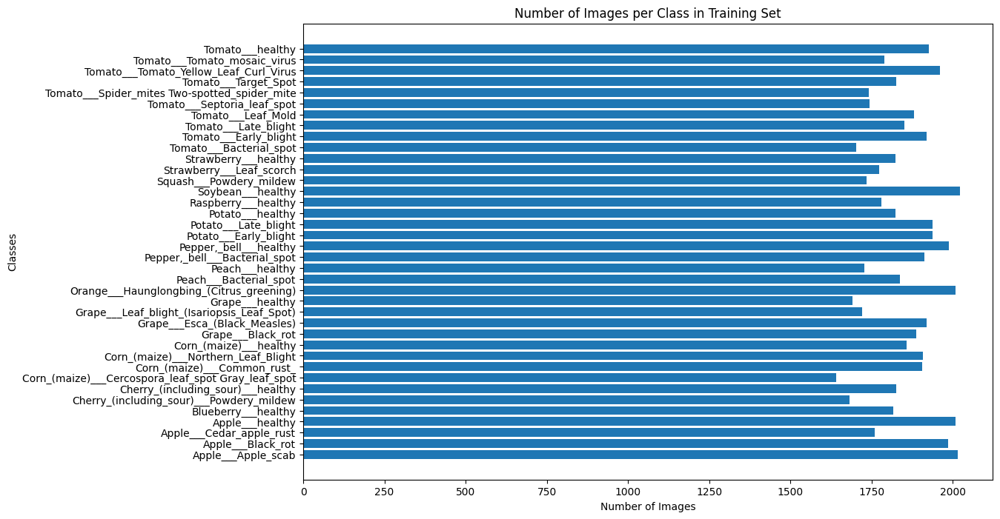

In [12]:
# Display a bar plot of the image count per class
plt.figure(figsize=(12, 8))
plt.barh(list(class_counts.keys()), list(class_counts.values()))
plt.xlabel("Number of Images")
plt.ylabel("Classes")
plt.title("Number of Images per Class in Training Set")
plt.show()

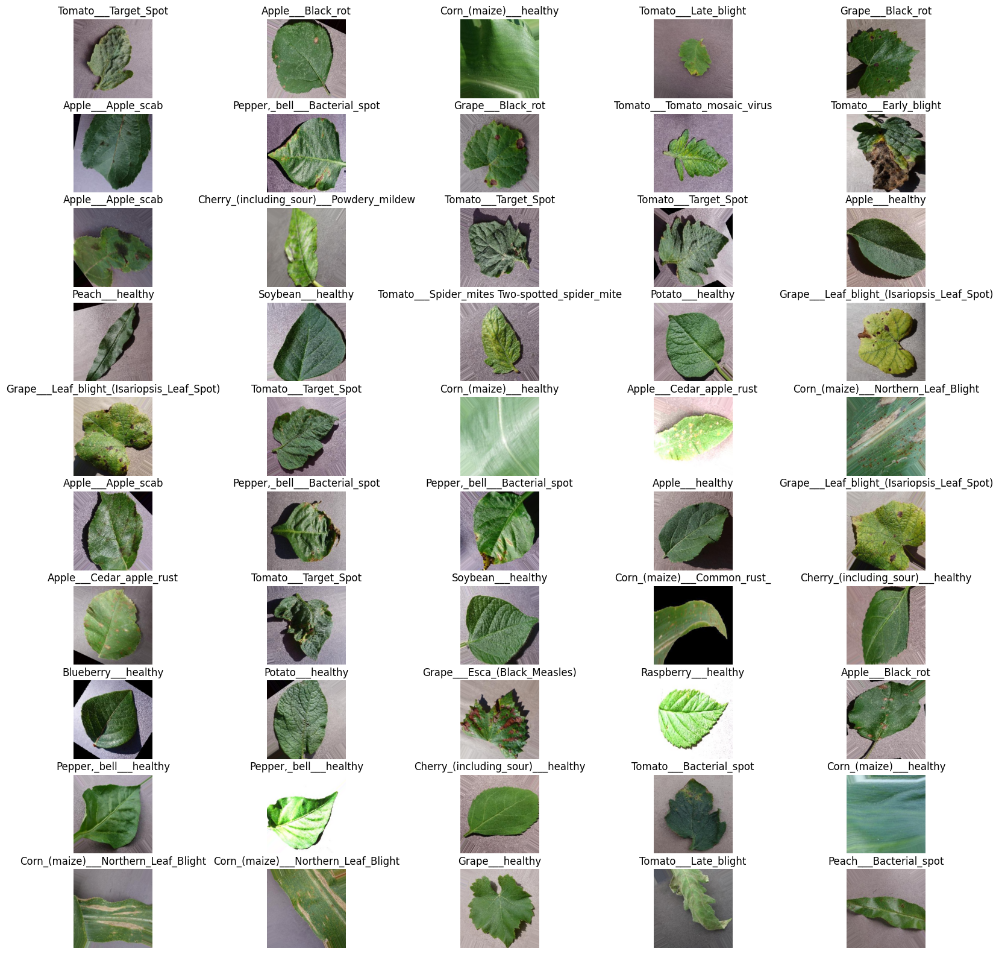

In [13]:
# Get a batch of images and labels from the train_generator
images, labels = next(traindata_generator)  # Get the next batch (128 images in this case)

# Reverse the class_indices dictionary to get a mapping from index to class name
class_labels = {v: k for k, v in traindata_generator.class_indices.items()}

# Convert one-hot encoded labels back to the index form (if using categorical mode)
label_indices = np.argmax(labels, axis=1)

# If you want to shuffle the batch and display 50 random images
random_indices = np.random.choice(len(images), 50, replace=False)  # Choose 50 random indices

# Plot 50 random images with labels
plt.figure(figsize=(20, 20))
for i, idx in enumerate(random_indices):
    plt.subplot(10, 5, i + 1)  # Create a grid of 5 rows and 10 columns
    plt.imshow(images[idx])
    plt.title(class_labels[label_indices[idx]])  # Show the label as the title
    plt.axis('off')  # Hide the axis

plt.show()

# Create MobileNetV2 Model

In [14]:
# detect and init the TPU
tpu = tf.distribute.cluster_resolver.TPUClusterResolver()

# instantiate a distribution strategy
tf.tpu.experimental.initialize_tpu_system(tpu)
tpu_strategy = tf.distribute.TPUStrategy(tpu)

# instantiating the model in the strategy scope creates the model on the TPU
with tpu_strategy.scope():

    base_model=MobileNetV2(input_shape=(224,224,3),weights='imagenet',include_top=False)
    base_model.trainable = False

    inputs = keras.Input(shape=(224, 224, 3))
    x = base_model(inputs, training=False)
    x = keras.layers.GlobalAveragePooling2D()(x)
    x = keras.layers.Dropout(0.2)(x)
    outputs = keras.layers.Dense(38, activation="softmax")(x)
    mobilenet_model = keras.Model(inputs, outputs, name='mobilenet_model')
    mobilenet_model.summary()

    mobilenet_model.compile(optimizer='adam',loss='categorical_crossentropy',
                        metrics=['accuracy',metrics.Recall(),metrics.Precision()])


9406464/9406464 [==============================] - 0s 0us/step
Model: "mobilenet_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d (  (None, 1280)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dropout (Dropout)           (None, 1280)              0         
                                                                 
 dense (Dense)               (None, 38)                48678     
                                                      

In [15]:

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint,ReduceLROnPlateau

early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

model_checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)

model_ReduceLROnPlateau = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=15, min_lr=0.000001)

callbacks=[early_stopping,model_checkpoint,model_ReduceLROnPlateau]

In [17]:
history = mobilenet_model.fit(traindata_generator,
                    epochs          = 30,
                    batch_size=None,
                    validation_data = validdata_generator,
                    callbacks = callbacks
                    )

Epoch 1/30
386/386 [==============================] - 895s 2s/step - loss: 0.6631 - accuracy: 0.8200 - recall: 0.6828 - precision: 0.9317 - val_loss: 0.4452 - val_accuracy: 0.8685 - val_recall: 0.8002 - val_precision: 0.9298 - lr: 0.0010
Epoch 2/30
386/386 [==============================] - 872s 2s/step - loss: 0.3529 - accuracy: 0.8939 - recall: 0.8478 - precision: 0.9377 - val_loss: 0.3554 - val_accuracy: 0.8881 - val_recall: 0.8443 - val_precision: 0.9339 - lr: 0.0010
Epoch 3/30
386/386 [==============================] - 865s 2s/step - loss: 0.2854 - accuracy: 0.9130 - recall: 0.8803 - precision: 0.9441 - val_loss: 0.3054 - val_accuracy: 0.9032 - val_recall: 0.8671 - val_precision: 0.9350 - lr: 0.0010
Epoch 4/30
386/386 [==============================] - 873s 2s/step - loss: 0.2563 - accuracy: 0.9208 - recall: 0.8936 - precision: 0.9470 - val_loss: 0.2906 - val_accuracy: 0.9059 - val_recall: 0.8772 - val_precision: 0.9367 - lr: 0.0010
Epoch 5/30
386/386 [============================

# Summarize History For Accuracy

In [18]:
#plotting training values
import seaborn as sns
sns.set()

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

precision = history.history['precision']
val_precision = history.history['val_precision']

recall =history.history['recall']
val_recall =history.history['val_recall']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(loss) + 1)

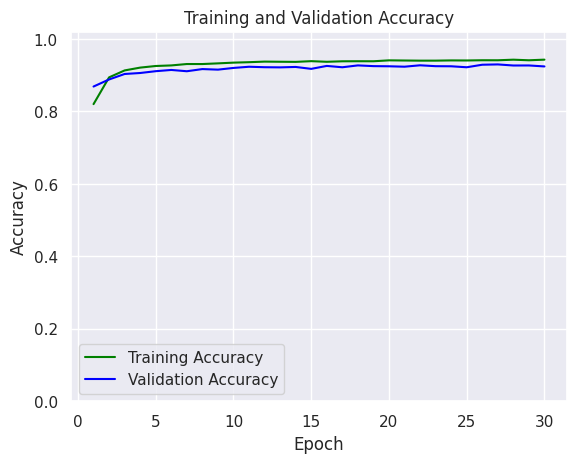

In [19]:
#accuracy plot
plt.plot(epochs, acc, color='green', label='Training Accuracy')
plt.plot(epochs, val_acc, color='blue', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.ylim(0,1.02)
plt.show()

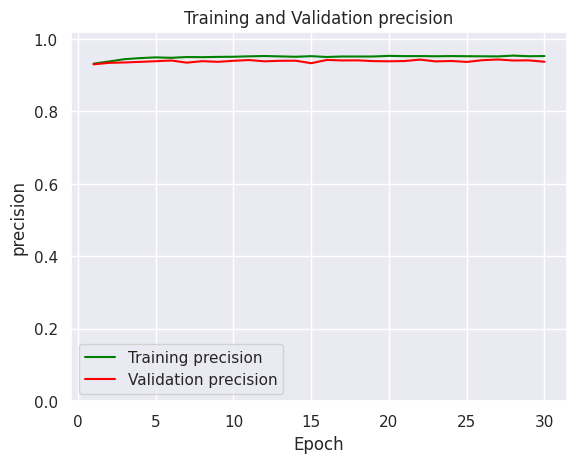

In [20]:
plt.figure()
#precision plot
plt.plot(epochs, precision, color='green', label='Training precision')
plt.plot(epochs, val_precision, color='red', label='Validation precision')
plt.title('Training and Validation precision')
plt.xlabel('Epoch')
plt.ylabel('precision')
plt.legend()
plt.ylim(0,1.02)
plt.show()

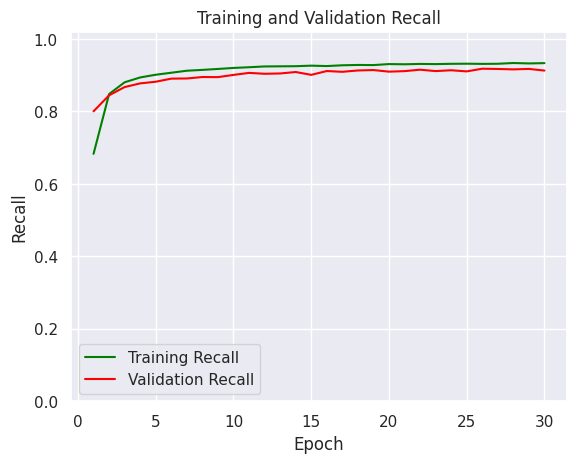

In [21]:
plt.figure()
#recall plot
plt.plot(epochs, recall, color='green', label='Training Recall')
plt.plot(epochs, val_recall, color='red', label='Validation Recall')
plt.title('Training and Validation Recall')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.legend()
plt.ylim(0,1.02)
plt.show()

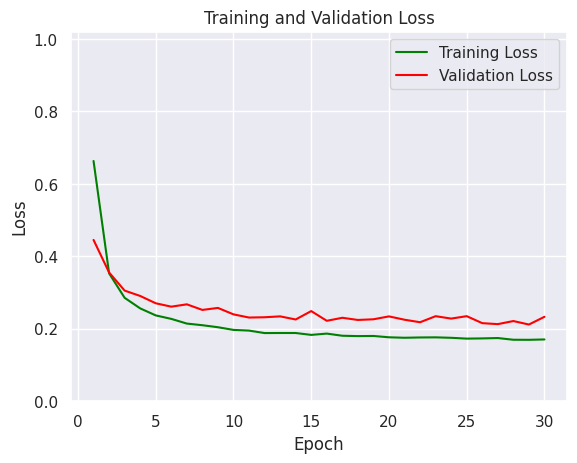

In [22]:
plt.figure()
#loss plot
plt.plot(epochs, loss, color='green', label='Training Loss')
plt.plot(epochs, val_loss, color='red', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.ylim(0,1.02)
plt.show()

In [23]:
# Evaluate the model
model_evaluate = mobilenet_model.evaluate(test_generator)
print("Loss     : ",model_evaluate[0])
print("Accuracy : ",model_evaluate[1])
print("Precision  : ",model_evaluate[2])
print("Recall : ",model_evaluate[3])

108/108 [==============================] - 80s 728ms/step - loss: 0.1967 - accuracy: 0.9343 - recall: 0.9235 - precision: 0.9475
Loss     :  0.19667783379554749
Accuracy :  0.934270441532135
Precision  :  0.9234578013420105
Recall :  0.9474514126777649


# Save And Load Model

In [31]:
mobilenet_model.save('/content/drive/MyDrive/Colab Notebooks/Plant Disease/mobilenetv2_plantdiseases.keras')

In [32]:

model = load_model('/content/drive/MyDrive/Colab Notebooks/Plant Disease/mobilenetv2_plantdiseases.keras')


In [24]:
predictions = mobilenet_model.predict(test_generator)

108/108 [==============================] - 83s 692ms/step


In [25]:
l = test_generator.class_indices.keys()
classnames=[]
for i in l:
   classnames.append(i)
classnames

['Apple___Apple_scab',
 'Apple___Black_rot',
 'Apple___Cedar_apple_rust',
 'Apple___healthy',
 'Blueberry___healthy',
 'Cherry_(including_sour)___Powdery_mildew',
 'Cherry_(including_sour)___healthy',
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
 'Corn_(maize)___Common_rust_',
 'Corn_(maize)___Northern_Leaf_Blight',
 'Corn_(maize)___healthy',
 'Grape___Black_rot',
 'Grape___Esca_(Black_Measles)',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Grape___healthy',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Peach___Bacterial_spot',
 'Peach___healthy',
 'Pepper,_bell___Bacterial_spot',
 'Pepper,_bell___healthy',
 'Potato___Early_blight',
 'Potato___Late_blight',
 'Potato___healthy',
 'Raspberry___healthy',
 'Soybean___healthy',
 'Squash___Powdery_mildew',
 'Strawberry___Leaf_scorch',
 'Strawberry___healthy',
 'Tomato___Bacterial_spot',
 'Tomato___Early_blight',
 'Tomato___Late_blight',
 'Tomato___Leaf_Mold',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Spider_mites Two-spotted_

# Confusion Matrix, Classification Report and ROC AUC Score

108/108 [==============================] - 74s 671ms/step
There were 1155 errors in 17572 tests for an accuracy of  93.43 and an F1 score of  93.43


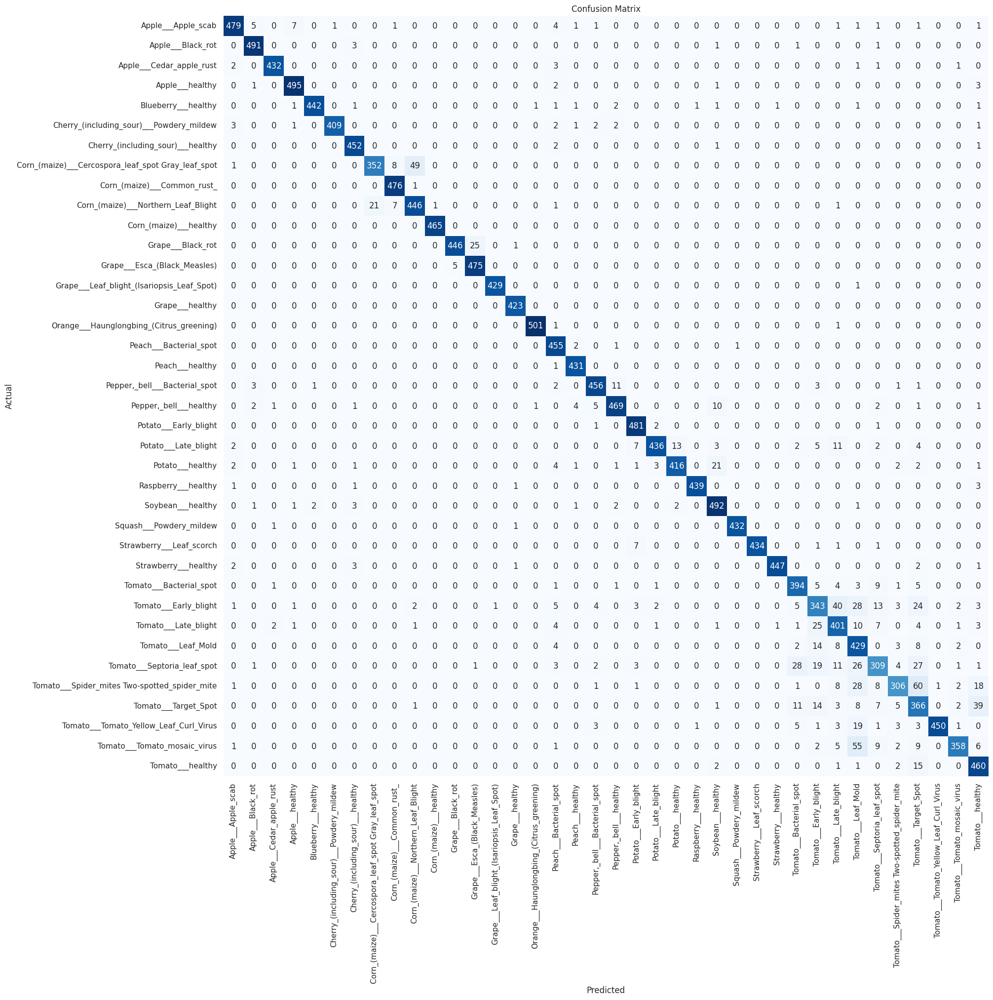

Classification Report:
----------------------
                                                     precision    recall  f1-score   support

                                Apple___Apple_scab     0.9677    0.9504    0.9590       504
                                 Apple___Black_rot     0.9742    0.9879    0.9810       497
                          Apple___Cedar_apple_rust     0.9886    0.9818    0.9852       440
                                   Apple___healthy     0.9744    0.9861    0.9802       502
                               Blueberry___healthy     0.9933    0.9736    0.9833       454
          Cherry_(including_sour)___Powdery_mildew     0.9976    0.9715    0.9844       421
                 Cherry_(including_sour)___healthy     0.9720    0.9912    0.9815       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot     0.9437    0.8585    0.8991       410
                       Corn_(maize)___Common_rust_     0.9675    0.9979    0.9825       477
               Corn_(maize)___No

In [26]:
import numpy as np
from sklearn.metrics import roc_auc_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score


def predictor(model, test_gen):
    classes = list(test_gen.class_indices.keys())

    preds = model.predict(test_gen, verbose=1)
    # Store the probabilities for ROC AUC calculation
    predictions = preds

    errors = 0
    pred_indices = []

    test_count = len(preds)

    for i, p in enumerate(preds):
        pred_index = np.argmax(p)
        pred_indices.append(pred_index)

        true_index = test_gen.labels[i]

        if pred_index != true_index:
            errors += 1

    accuracy = (test_count - errors) * 100 / test_count

    ytrue = np.array(test_gen.labels, dtype='int')
    ypred = np.array(pred_indices, dtype='int')

    f1score = f1_score(ytrue, ypred, average='weighted') * 100

    msg = f'There were {errors} errors in {test_count} tests for an accuracy of {accuracy:6.2f} and an F1 score of {f1score:6.2f}'

    print(msg)

    cm = confusion_matrix(ytrue, ypred)

    # plot the confusion matrix
    plt.figure(figsize=(20, 20))
    sns.heatmap(cm, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)
    plt.xticks(np.arange(len(classes)) + .5, classes, rotation=90)
    plt.yticks(np.arange(len(classes)) + .5, classes, rotation=0)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title("Confusion Matrix")
    plt.show()

    clr = classification_report(ytrue, ypred, target_names=classes, digits=4)  # create classification report
    print("Classification Report:\n----------------------\n", clr)

    # Return the true labels and predictions for ROC AUC calculation
    return ytrue, predictions

# Assuming 'm' is your test generator and 'mobilenet_model' is your trained model
ytrue, predictions = predictor(mobilenet_model, test_generator)
# Calculate ROC AUC score
# 'ytrue' should be the true labels
# 'predictions' should be the predicted probabilities for each class
roc_auc = roc_auc_score(ytrue, predictions, multi_class='ovr')
print("ROC AUC Score is {}".format(roc_auc))

ROC AUC Score is 0.9989586696574332


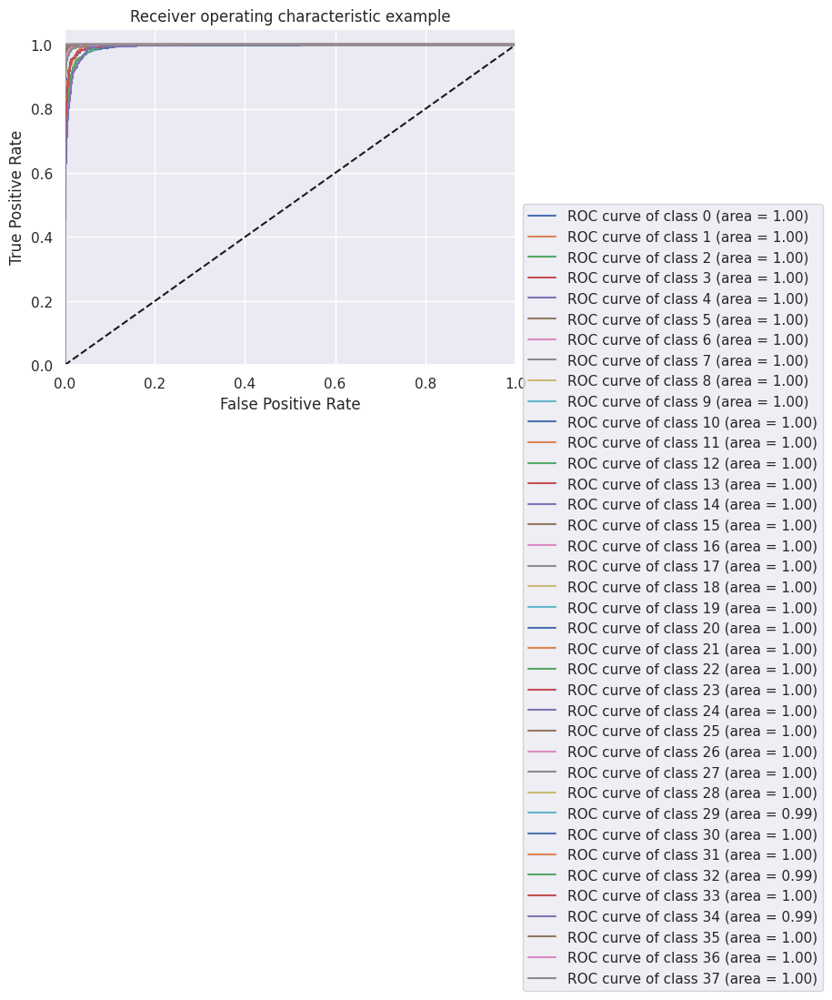

In [28]:

# Calculate ROC AUC score
roc_auc = roc_auc_score(ytrue, predictions, multi_class='ovr')
print("ROC AUC Score is {}".format(roc_auc))

# Binarize the true labels for multi-class ROC curve plotting
ytrue_bin = label_binarize(ytrue, classes=np.unique(ytrue))
n_classes = ytrue_bin.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(ytrue_bin[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot the ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'
                                   ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="best", bbox_to_anchor=(1, 0.5)) # Adjust legend position here
plt.show()

# Model Prediction

108/108 [==============================] - 149s 1s/step


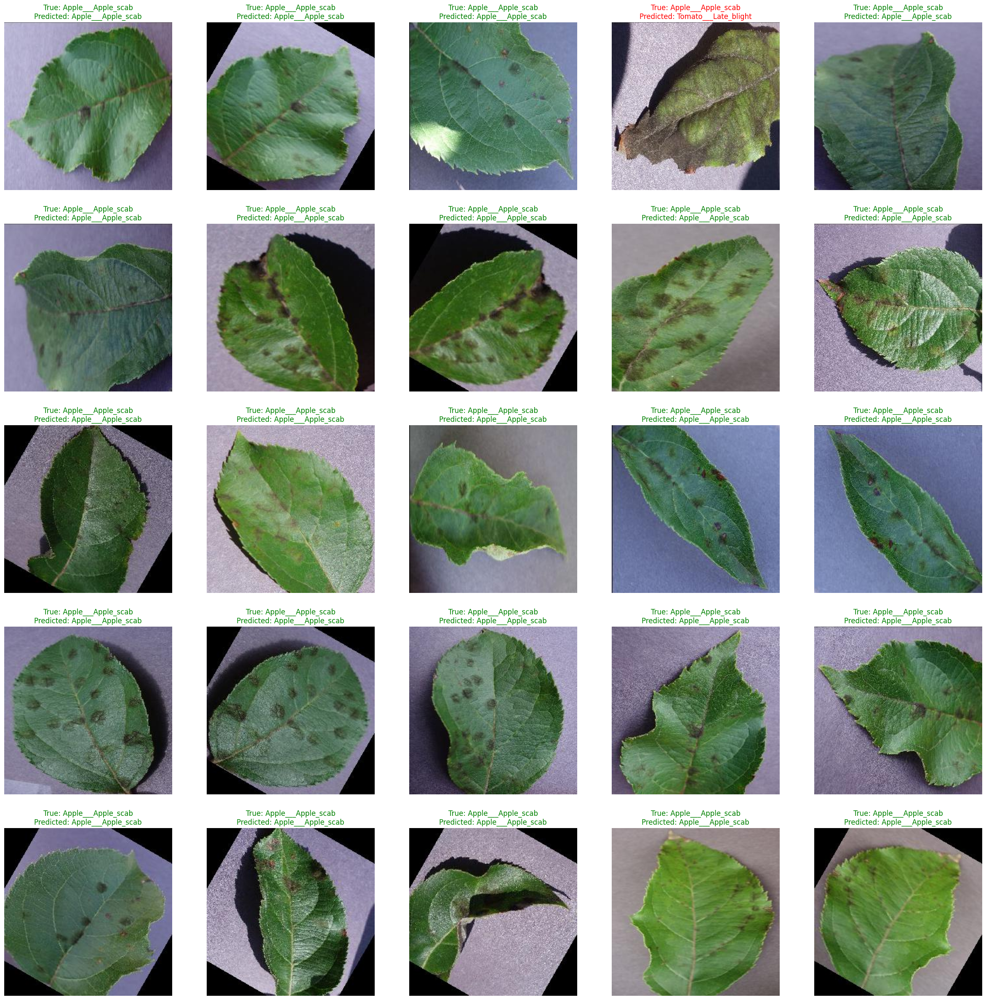

In [33]:
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

model = load_model('mobilenetv2_plantdiseases.keras')
class_name = list(test_generator.class_indices.keys())

# Predict using the model
final_predict = model.predict(test_generator).argmax(axis=1) # This line is added

plt.figure(figsize=(30,30))
number_images=(5,5)
for i in range(1,(number_images[0]*number_images[1])+1):
    plt.subplot(number_images[0],number_images[1],i)
    plt.axis("off")

    true_label = class_name[test_generator.classes[i]]
    predicted_label = class_name[final_predict[i]] # Now final_predict is defined and can be used

    color="green"
    if true_label != predicted_label:
        color="red"

    plt.title(f"True: {true_label}\nPredicted: {predicted_label}", color=color)
    plt.imshow(plt.imread(test_generator.filepaths[i]))
plt.show()